<a href="https://colab.research.google.com/github/charaforhanou/machineleurning-projet/blob/main/LEAF_iT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [51]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint

In [2]:
#import  archive.zip from     /content/drive/MyDrive/PROJET_TNI/

!unzip /content/drive/MyDrive/PROJET_TNI/archive.zip -d /content/data/


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: /content/data/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08c033bd-fbc3-445a-88d1-1863070e52ce___YLCV_GCREC 2872.JPG  
  inflating: /content/data/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08dd176c-e9d9-4746-92c3-fa8dc9074347___UF.GRC_YLCV_Lab 03057.JPG  
  inflating: /content/data/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08f78a80-46f5-45a6-937c-4d05d61c08c2___UF.GRC_YLCV_Lab 01895.JPG  
  inflating: /content/data/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0903aa95-6e8a-4abd-a003-126fcd9a5493___YLCV_GCREC 2806.JPG  
  inflating: /content/data/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0911d416-d73d-4c2a-8e45-207a7ceb7c9a___YLCV_GCREC 2773.JPG  
  inflating: /content/data/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/09188838-cc89-4925-94c5-d9563c4cb4bf___UF.GRC_YLCV_Lab 0297

In [10]:
# Correct directory path
directory_path = "/content/data/PlantVillage/"

# Get all the class names in the directory
class_names = os.listdir(directory_path)

# Print the number of classes
print(f"Number of classes: {len(class_names)}")
print(class_names)

Number of classes: 15


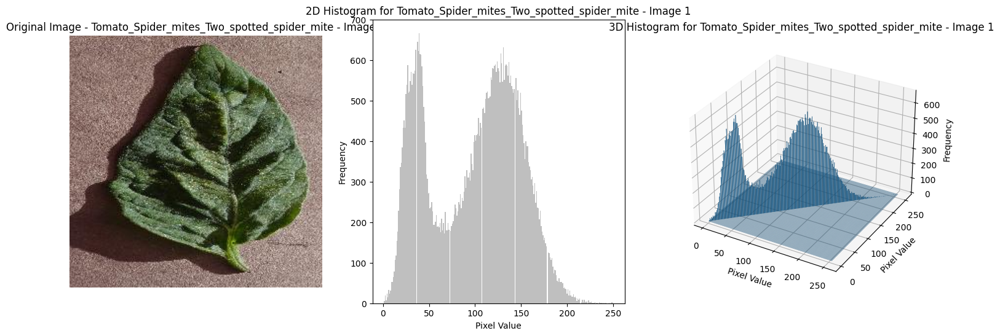

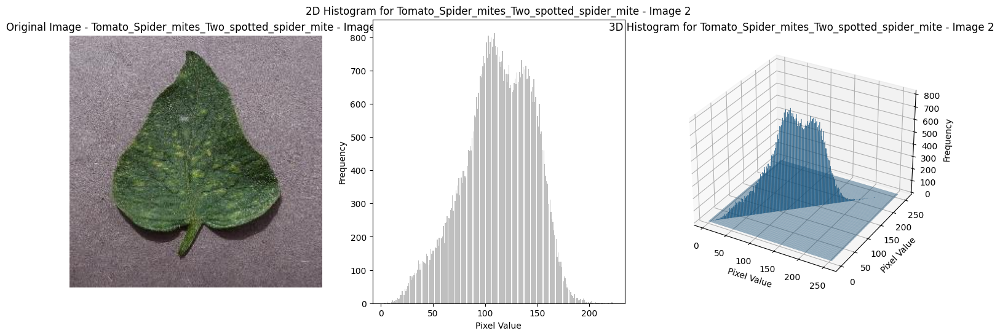

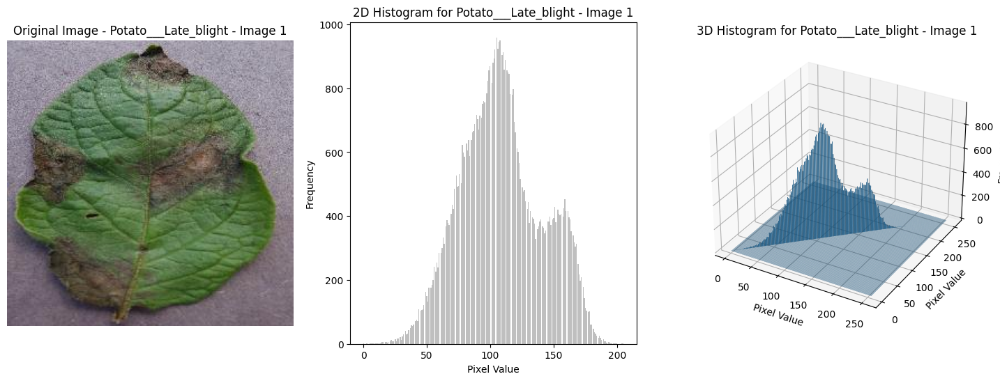

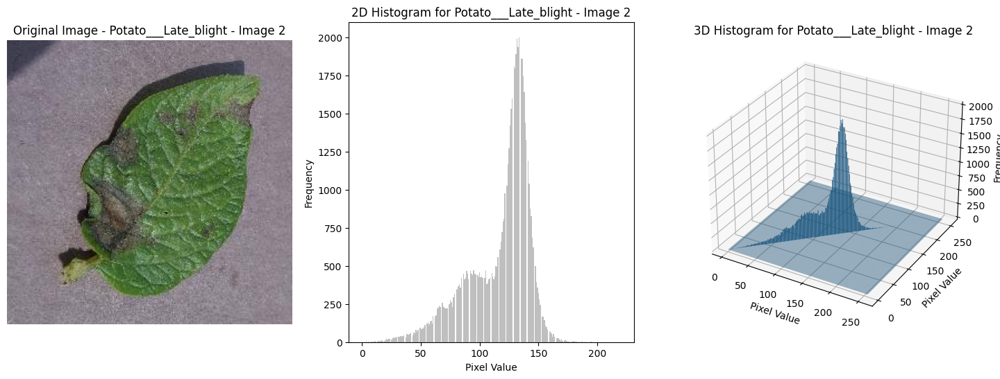

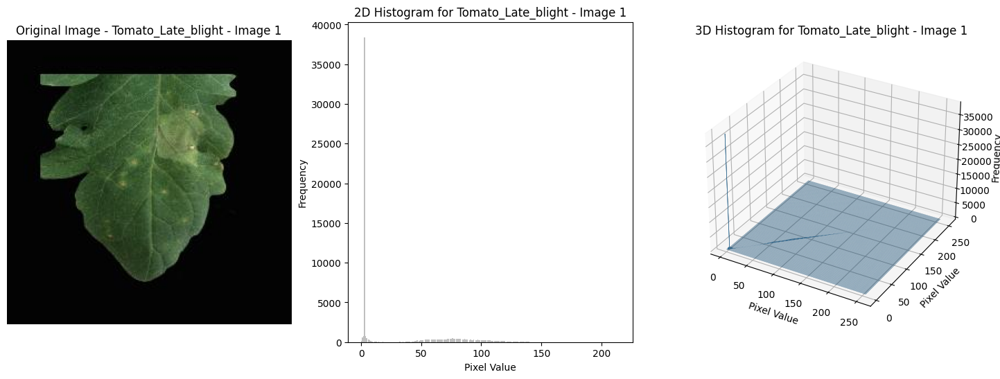

...

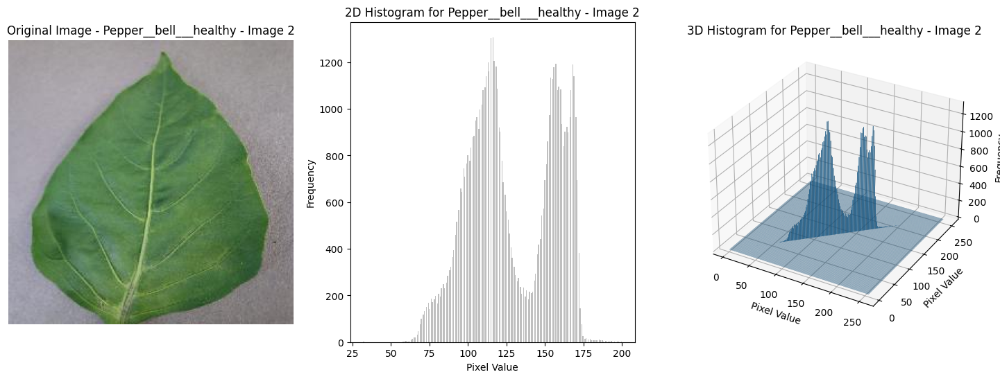

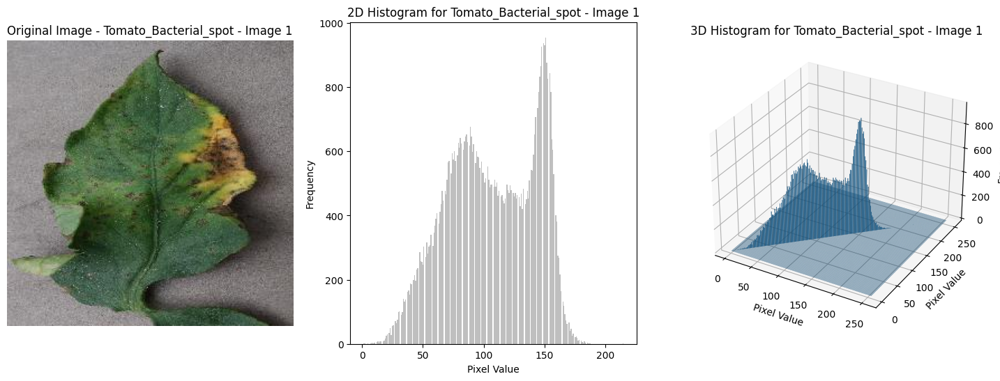

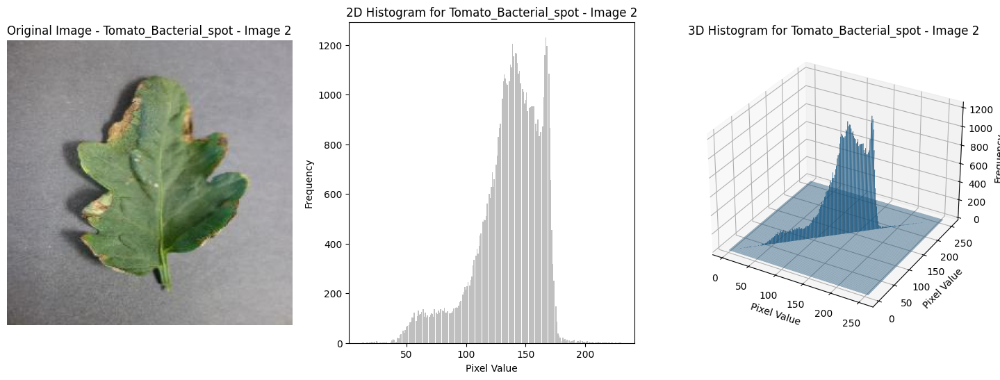

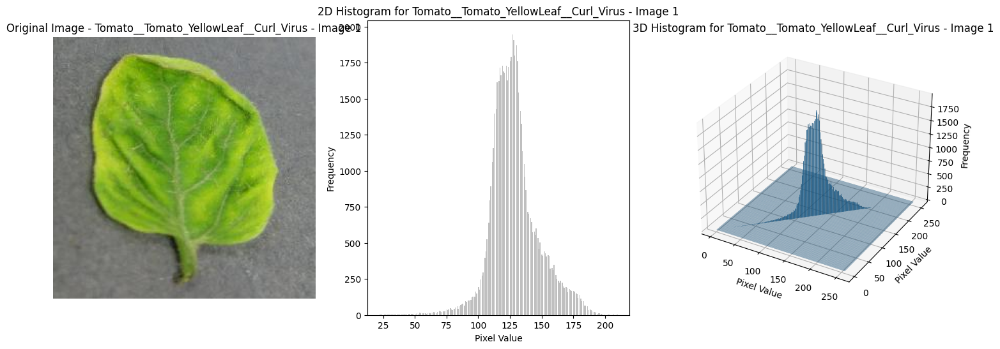

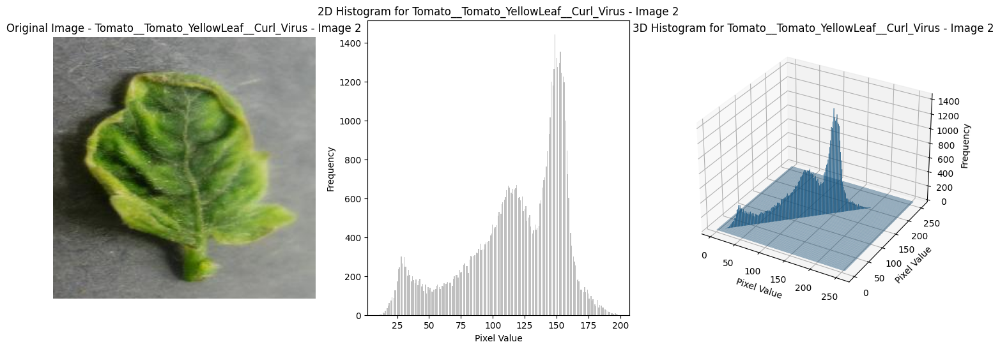

In [52]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Function to preprocess images and plot histograms
def preprocess_and_plot_histograms(directory_path, class_names):
    for class_name in class_names:
        class_path = os.path.join(directory_path, class_name)
        images = os.listdir(class_path)

        # Take two images from each class
        for i in range(2):
            image_path = os.path.join(class_path, images[i])
            image = cv2.imread(image_path)
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            fig = plt.figure(figsize=(18, 6))

            # Show original image
            ax1 = fig.add_subplot(1, 3, 1)
            ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            ax1.set_title(f'Original Image - {class_name} - Image {i+1}')
            ax1.axis('off')

            # Plot 2D histogram
            ax2 = fig.add_subplot(1, 3, 2)
            ax2.hist(gray_image.ravel(), bins=256, color='gray', alpha=0.5)
            ax2.set_title(f'2D Histogram for {class_name} - Image {i+1}')
            ax2.set_xlabel('Pixel Value')
            ax2.set_ylabel('Frequency')

            # Plot 3D histogram
            ax3 = fig.add_subplot(1, 3, 3, projection='3d')
            hist, xedges, yedges = np.histogram2d(
                gray_image.ravel(), gray_image.ravel(), bins=256, range=[[0, 256], [0, 256]]
            )
            xpos, ypos = np.meshgrid(xedges[:-1] + 0.5, yedges[:-1] + 0.5, indexing="ij")
            xpos = xpos.ravel()
            ypos = ypos.ravel()
            zpos = 0

            dx = dy = 0.5 * np.ones_like(zpos)
            dz = hist.ravel()

            ax3.bar3d(xpos, ypos, zpos, dx, dy, dz, zsort='average')
            ax3.set_title(f'3D Histogram for {class_name} - Image {i+1}')
            ax3.set_xlabel('Pixel Value')
            ax3.set_ylabel('Pixel Value')
            ax3.set_zlabel('Frequency')

            plt.show()

# Example usage:
directory_path = '/content/data/plantvillage/PlantVillage'
class_names = ['Tomato_Spider_mites_Two_spotted_spider_mite', 'Potato___Late_blight', 'Tomato_Late_blight',
               'Potato___healthy', 'Pepper__bell___Bacterial_spot', 'Tomato__Tomato_mosaic_virus',
               'Tomato_Leaf_Mold', 'Tomato_healthy', 'Potato___Early_blight', 'Tomato__Target_Spot',
               'Tomato_Early_blight', 'Tomato_Septoria_leaf_spot', 'Pepper__bell___healthy',
               'Tomato_Bacterial_spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus']

preprocess_and_plot_histograms(directory_path, class_names)


In [18]:
import os
import shutil
import numpy as np
from sklearn.model_selection import train_test_split

def split_data(original_dir, base_dir, class_names, val_split=0.2):
    train_dir = os.path.join(base_dir, 'training')
    val_dir = os.path.join(base_dir, 'validation')

    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)

    for class_name in class_names:
        # Use os.path.join to create the correct subdirectory paths
        os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
        os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)

        class_dir = os.path.join(original_dir, class_name)
        images = os.listdir(class_dir)
        train_images, val_images = train_test_split(images, test_size=val_split, random_state=42)

        for image in train_images:
            src = os.path.join(class_dir, image)
            dst = os.path.join(train_dir, class_name, image)
            shutil.copyfile(src, dst)

        for image in val_images:
            src = os.path.join(class_dir, image)
            dst = os.path.join(val_dir, class_name, image)
            shutil.copyfile(src, dst)

# Directory paths
original_directory_path = "/content/data/PlantVillage/"  # Make sure this path is correct
base_directory_path = "/content/PlantVillage_split/"

# Class names
class_names = ['Tomato_Spider_mites_Two_spotted_spider_mite', 'Potato___Late_blight', 'Tomato_Late_blight',
               'Potato___healthy', 'Pepper__bell___Bacterial_spot', 'Tomato__Tomato_mosaic_virus',
               'Tomato_Leaf_Mold', 'Tomato_healthy', 'Potato___Early_blight', 'Tomato__Target_Spot',
               'Tomato_Early_blight', 'Tomato_Septoria_leaf_spot', 'Pepper__bell___healthy',
               'Tomato_Bacterial_spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus']

# Split the data
split_data(original_directory_path, base_directory_path, class_names)

# Verify that the directories were created successfully
print(os.listdir(base_directory_path))  # Should print ['training', 'validation']
print(os.listdir(os.path.join(base_directory_path, 'training')))  # Should print all class names

['validation', 'training']
['Tomato_Spider_mites_Two_spotted_spider_mite', 'Potato___Late_blight', 'Tomato_Late_blight', 'Potato___healthy', 'Pepper__bell___Bacterial_spot', 'Tomato__Tomato_mosaic_virus', 'Tomato_Leaf_Mold', 'Tomato_healthy', 'Potato___Early_blight', 'Tomato__Target_Spot', 'Tomato_Early_blight', 'Tomato_Septoria_leaf_spot', 'Pepper__bell___healthy', 'Tomato_Bacterial_spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus']


In [42]:
# Function to load and preprocess images
def load_and_preprocess_image(file_path):
    # Decode the image, handling potential errors
    try:
        image = tf.io.read_file(file_path)
        image = tf.image.decode_jpeg(image, channels=1)
    except tf.errors.InvalidArgumentError as e:
        print(f"Error reading file: {file_path}. Error: {e}")
        return None  # Return None for invalid files

    image = tf.image.resize(image, [64, 64])
    image /= 255.0
    return image
# Function to get dataset
def get_dataset(directory_path, class_names, subset):
    file_paths = []
    labels = []
    if subset == 'training':
      directory_path = '/content/PlantVillage_split/training/'
    elif subset == 'validation':
      directory_path = '/content/PlantVillage_split/validation/'
    for i, class_name in enumerate(class_names):
        class_path = os.path.join(directory_path, class_name)
        # Get all files in the class directory, then filter for .JPG files
        all_files = os.listdir(class_path)
        images = [f for f in all_files if f.lower().endswith('.jpg')]  # Case-insensitive filtering
        if subset == 'training':
            images = images[:int(0.8*len(images))]
        else:
            images = images[int(0.8*len(images)):]
        for image in images:
            file_path = os.path.join(class_path, image)
            if os.path.exists(file_path):
                file_paths.append(file_path)
                labels.append(i)
            else:
                print(f"File not found: {file_path}")

    file_paths = np.array(file_paths)
    labels = np.array(labels)
    dataset = tf.data.Dataset.from_tensor_slices((file_paths, labels))
    dataset = dataset.map(lambda x, y: (load_and_preprocess_image(x), tf.one_hot(y, len(class_names))))
    return dataset.shuffle(buffer_size=len(file_paths)).batch(32).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [43]:
import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Get training and validation datasets


train_dataset = get_dataset(base_directory_path, class_names, 'training')
val_dataset = get_dataset(base_directory_path, class_names, 'validation')

# Simplified CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

# Model compilation
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model checkpoint
checkpoint = ModelCheckpoint('plant_disease_detector.h5', save_best_only=True, monitor='val_loss', mode='min')

# Model training
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=20,
    callbacks=[checkpoint]
)

# Model evaluation
loss, accuracy = model.evaluate(val_dataset)
print(f'Model Accuracy: {accuracy*100:.2f}%')

# Save the model
model.save('plant_disease_detector.h5')
filename = "plant_disease_detector.h5"
from google.colab import files
with open(filename, 'rb') as f:
    files.download(filename)

Epoch 1/20
413/413 [==============================] - 78s 170ms/step - loss: 2.0751 - accuracy: 0.3304 - val_loss: 1.5140 - val_accuracy: 0.5433


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 2/20
413/413 [==============================] - 77s 175ms/step - loss: 1.5652 - accuracy: 0.4875 - val_loss: 1.2145 - val_accuracy: 0.6238
Epoch 3/20
413/413 [==============================] - 76s 172ms/step - loss: 1.3407 - accuracy: 0.5576 - val_loss: 1.1084 - val_accuracy: 0.6514
Epoch 4/20
413/413 [==============================] - 80s 179ms/step - loss: 1.1994 - accuracy: 0.6018 - val_loss: 0.9333 - val_accuracy: 0.6995
Epoch 5/20
413/413 [==============================] - 76s 169ms/step - loss: 1.0784 - accuracy: 0.6417 - val_loss: 0.8174 - val_accuracy: 0.7464
Epoch 6/20
413/413 [==============================] - 77s 177ms/step - loss: 0.9940 - accuracy: 0.6676 - val_loss: 0.7495 - val_accuracy: 0.7752
Epoch 7/20
413/413 [==============================] - 78s 175ms/step - loss: 0.8967 - accuracy: 0.6936 - val_loss: 0.7383 - val_accuracy: 0.7740
Epoch 8/20
413/413 [==============================] - 76s 173ms/step - loss: 0.8217 - accuracy: 0.7227 - val_loss: 0.7053 - val_ac

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [46]:
print(model.summary())


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 62, 62, 32)        320       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 31, 31, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 29, 29, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 14, 14, 64)        0         
 g2D)                                                            
                                                                 
 flatten_3 (Flatten)         (None, 12544)             0         
                                                                 
 dense_6 (Dense)             (None, 128)              

In [48]:
# prompt: i want ti test the model  by geven  him this photo /content/data/plantvillage/PlantVillage/Potato___healthy/00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864.JPG

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image
import numpy as np
# Load the test image as grayscale
img = keras.preprocessing.image.load_img(
    '/content/data/plantvillage/PlantVillage/Potato___healthy/00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864.JPG',
    target_size=(64, 64),
    color_mode='grayscale'  # Load as grayscale
)

# Preprocess the image
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, axis=0)  # Add batch dimension
img_array = img_array / 255.0  # Normalize pixel values

# Make prediction
predictions = model.predict(img_array)
predicted_class = class_names[np.argmax(predictions)]

# Print the prediction
print(f"Predicted class: {predicted_class}")

1/1 [==============================] - 0s 128ms/step
Predicted class: Potato___healthy


In [49]:
# prompt: save the model to the drive

#!cp /content/plant_disease_detector.h5 /content/drive/MyDrive/PROJET_TNI


#2
